In [1]:
## 2026.09.03 CODEX GBM twin of CODEX_hcc/HCC_train_validate_cv_UNIlabel_all.ipynb
## Cross-dataset training on both annotated replicates (P174511_Initial + P179161_Recurrent)
##
## CLI equivalent:
##   conda run --no-capture-output -n SeededNTM python -u \
##     code/CODEX_gbm/GBM_train_validate_cv_UNIlabel.py --mode cross-dataset \
##     --use-spatial-context --spatial-k 8 --spatial-mode mean \
##     --pooled-save-result result_all_spatial
##
## Hierarchy (three-head):
##   L2  = final_CT          (fine / subcluster / celltype_level2)
##   L12 = final_sublineage  (intermediate / spatial_niche / celltype_level1)
##   L1  = final_lineage     (coarse / cell_type / celltype_level0)
##
## Preprocess CSVs first:
##   conda run -n SeededNTM python code/CODEX_gbm/match_codex_cells_with_pixel.py
## Env: conda activate SeededNTM
## Set SKIP_POOLED_TRAIN=True in the config cell to reuse CLI weights.


In [2]:
## GBM_train_validate_cv_UNIlabel_all.ipynb
## Pool Cases/{sample}/{sample}_matched_features.h5ad → dataset-level CV
## Outputs under: data/CODEX/GBM/Results/{save_result}/
## StarDist per-sample plots: .../{save_result}/stardist/{sample}/
## Show three levels: L2 / L12 / L1 prediction results


In [3]:
import os

import warnings

# Keep notebook output clean.
warnings.filterwarnings("ignore")

# Choose physical GPU (string). Restart kernel after changing.
os.environ.setdefault("NCRT_CUDA_DEVICE", "0")
# Runtime env (GPU pin + tmpdir) before torch import.
# Ensure Hist2Pheno_pkg is importable before importing runtime helpers.
import sys as _sys
_pkg_dir = "/home/lingyu/ssd2/Python/Hist2Pheno/code/Hist2Pheno_pkg"
if _pkg_dir not in _sys.path:
    _sys.path.insert(0, _pkg_dir)

from runtime_env import configure_notebook_runtime
_rt_env = configure_notebook_runtime()
NCRT_PHYSICAL_GPU = _rt_env["physical_gpu"]


CUDA_VISIBLE_DEVICES=0 (physical GPU 0)


In [4]:

import sys
import importlib
import pandas as pd
from pathlib import Path

path = "/home/lingyu/ssd2/Python/"
for _d in (
    f"{path}Hist2Pheno/code/Hist2Pheno_pkg",
    f"{path}Hist2Pheno/code/CODEX_gbm",
):
    if _d not in sys.path:
        sys.path.insert(0, _d)

import base
import plot
import model as model_pkg
importlib.reload(base)
importlib.reload(plot)
importlib.reload(model_pkg)

import uni_label_cv_helpers as uni_nb
importlib.reload(uni_nb)

import GBM_train_validate_cv_UNIlabel as brca_cli
importlib.reload(brca_cli)

print("Imports OK")
print(f"CUDA_VISIBLE_DEVICES={os.environ.get('CUDA_VISIBLE_DEVICES')} (physical GPU {NCRT_PHYSICAL_GPU})")


Loading dependencies...
Loading dependencies...
Imports OK
CUDA_VISIBLE_DEVICES=0 (physical GPU 0)


In [5]:
## CUDA/CPU sanity check + reproducibility (delegated to Hist2Pheno_pkg)
import torch
import random
import numpy as np
from torch_runtime import configure_torch_runtime

SEED = 42
_rt = configure_torch_runtime(seed=SEED)

# Keep the same variable names used downstream.
device = _rt.device
amp_scaler = _rt.amp_scaler
CUDA_DEVICE_INDEX = _rt.cuda_device_index
PHYSICAL_GPU = _rt.physical_gpu


/nobackup2/users/lingyu/conda_envs/SeededNTM/bin/python
torch 2.9.1+cu130 | built with CUDA: 13.0 | cuda.is_available: True
CUDA_VISIBLE_DEVICES='0' -> physical GPU(s) '0'
Using physical GPU 0 as logical cuda:0 | NVIDIA RTX PRO 6000 Blackwell Server Edition
device: cuda:0 | physical GPU 0 | NVIDIA RTX PRO 6000 Blackwell Server Edition
Reproducibility configured with SEED=42


## Cross-dataset training (CODEX GBM P174511_Initial + P179161_Recurrent)

Pool pre-built `{sample}_matched_features.h5ad`, run **dataset-level group CV** (with 2 samples this is leave-one-replicate-out; OOF is the honest Ini↔Rec transfer metric), then **refit on all samples** for the StarDist checkpoint so Recurrent-only classes (G1S/G2M/NPC-like, SN3/SN4/SN7) are in the training vocabulary.

**Outputs:** `data/CODEX/GBM/Results/{save_result}/`

- Internal validation (OOF): L2 + L1 + L12 confusion matrices
- StarDist: `Results/{save_result}/stardist/{sample}/`

Run cells **in order** after kernel restart.

Set `QUICK_VALIDATE = True` in the config cell for a 1-epoch smoke test.
Set `SKIP_POOLED_TRAIN = True` to load an existing CLI checkpoint without retraining.


In [6]:
from uni_label_cv_helpers import (
    RESULT_FIG,
    make_pooled_result_fig,
    make_pooled_stardist_result_fig,
    _auroc_csv_path_from_metrics,
    ensure_lp_extra_insample_preds,
    plot_he_confusion_matrices,
)
from model import predict_all_label_heads
from plot import plot_confusion_matrix

GBM_ROOT = Path(f"{path}Hist2Pheno/data/CODEX/GBM")
DATA_ROOT = GBM_ROOT / "Results"
CASES_ROOT = GBM_ROOT / "Cases"
save_result = "result_all_spatial"

# Quick smoke test: 2-fold, 1 epoch
QUICK_VALIDATE = False
# True → load CLI best_mlp_gpu.pt only (no fold resume, no all-sample refit).
SKIP_POOLED_TRAIN = True
# Full microscope HE StarDist-all (§5/§6). GT labels cover only the Visium HD chip.
# Rec is ~1.16M StarDist nuclei (RAM/time heavy); drop it here to skip.
FULL_HE_SAMPLES = ["P174511_Initial", "P179161_Recurrent"]
VALIDATION_SUBSET = ["P174511_Initial", "P179161_Recurrent"]

all_samples = brca_cli.discover_brca_samples(CASES_ROOT, require_h5ad=False, require_cells_csv=True)
_acq_map = brca_cli.load_he_acq_map(CASES_ROOT)
_target = VALIDATION_SUBSET if QUICK_VALIDATE else all_samples
for _s in _target:
    _h5 = CASES_ROOT / _s / f"{_s}_matched_features.h5ad"
    if _h5.is_file():
        continue
    print(f"Building HE h5ad for {_s} ...", flush=True)
    _ctx = brca_cli.RunContext(
        sample=_s,
        cases_root=CASES_ROOT,
        python_root=Path(path),
        therapy_data=_s,
        therapy_model=brca_cli.DEFAULT_THERAPY_MODEL,
        save_result="result",
        device=device,
        seed=SEED,
        match_tolerance=1.0,
        column_rename=dict(brca_cli.HCC_COLUMN_RENAME),
        force_rebuild_h5ad=False,
        input_dim=None,
        hidden_dims=(1024, 512, 256),
        cv_k=5,
        stratify_target="level2",
        patience=10,
        max_epochs=50,
        train_batch_size=4096,
        resume_from_checkpoints=True,
        ablation_tag="D_emph_L2_spatial",
        hce_w1=1.0, hce_w2=2.0, hce_w12=1.0, hce_w_l12head=1.0, hce_w_l3=1.0, hce_w_l4=1.0,
        build_stardist_h5ad=False,
        acq_id=_acq_map[_s],
        use_spatial_context=True,
        spatial_k=8,
        spatial_mode="mean",
    )
    brca_cli.step_he_h5ad(_ctx)

POOLED_SAMPLES = brca_cli.discover_brca_samples(
    CASES_ROOT,
    sample=None,
    require_h5ad=True,
)
if QUICK_VALIDATE:
    POOLED_SAMPLES = [s for s in VALIDATION_SUBSET if s in POOLED_SAMPLES]
print(f"Cross-dataset: {len(POOLED_SAMPLES)} datasets (GBM three-head)")

pooled_result_fig, pooled_result_dir = make_pooled_result_fig(DATA_ROOT, save_result)
FIG = RESULT_FIG
print(f"Results → {pooled_result_dir}")

POOLED_CV_K = 2 if QUICK_VALIDATE else min(5, max(len(POOLED_SAMPLES), 1))  # 2 reps → LORO OOF; deploy refits on all samples when n_sections < k
POOLED_MAX_EPOCHS = 1 if QUICK_VALIDATE else 50
POOLED_PATIENCE = 1 if QUICK_VALIDATE else 10
POOLED_TRAIN_GROUP_FRAC = 0.7
POOLED_TRAIN_BATCH_SIZE = 256 if QUICK_VALIDATE else 4096
POOLED_USE_SPATIAL = True
POOLED_SPATIAL_K = 8
POOLED_SPATIAL_MODE = "mean"
if POOLED_USE_SPATIAL and not QUICK_VALIDATE:
    POOLED_ABLATION_TAG = "D_emph_L2_spatial_bs4096"
elif QUICK_VALIDATE:
    POOLED_ABLATION_TAG = "D_emph_L2_smoke"
else:
    POOLED_ABLATION_TAG = "D_emph_L2"
POOLED_HIDDEN_DIMS = (1024, 512, 256)
POOLED_HCE = dict(hce_w1=1.0, hce_w2=2.0, hce_w12=1.0, hce_w_l12head=1.0, hce_w_l3=1.0, hce_w_l4=1.0)
POOLED_VAL_SELECTION = brca_cli.DEFAULT_VAL_SELECTION_METRIC  # three_tier_auc_sum
POOLED_CV_SELECTION = brca_cli.DEFAULT_CV_SELECTION_METRIC

pooled_ctx = brca_cli.PooledRunContext(
    data_root=DATA_ROOT,
    cases_root=CASES_ROOT,
    python_root=Path(path),
    samples=POOLED_SAMPLES,
    device=device,
    seed=SEED,
    save_result=save_result,
    input_dim=None,
    hidden_dims=POOLED_HIDDEN_DIMS,
    cv_k=POOLED_CV_K,
    train_group_frac=POOLED_TRAIN_GROUP_FRAC,
    patience=POOLED_PATIENCE,
    max_epochs=POOLED_MAX_EPOCHS,
    train_batch_size=POOLED_TRAIN_BATCH_SIZE,
    resume_from_checkpoints=not QUICK_VALIDATE,
    ablation_tag=POOLED_ABLATION_TAG,
    val_selection_metric=POOLED_VAL_SELECTION,
    cv_selection_metric=POOLED_CV_SELECTION,
    use_spatial_context=POOLED_USE_SPATIAL,
    spatial_k=POOLED_SPATIAL_K,
    spatial_mode=POOLED_SPATIAL_MODE,
    **POOLED_HCE,
)

print(f"Selection: val={POOLED_VAL_SELECTION}, cv={POOLED_CV_SELECTION}")
print(f"Ablation tag: {POOLED_ABLATION_TAG}, batch_size={POOLED_TRAIN_BATCH_SIZE}")
if POOLED_USE_SPATIAL:
    print(f"Spatial context: k={POOLED_SPATIAL_K}, mode={POOLED_SPATIAL_MODE!r}")
print("Three-head levels: L2=final_CT | L12=final_sublineage | L1=final_lineage")
print(f"SKIP_POOLED_TRAIN={SKIP_POOLED_TRAIN}")
print(f"FULL_HE_SAMPLES={FULL_HE_SAMPLES}")


Cross-dataset: 2 datasets (GBM three-head)
Results → /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial
Selection: val=three_tier_auc_sum, cv=three_tier_auc_sum
Ablation tag: D_emph_L2_spatial_bs4096, batch_size=4096
Spatial context: k=8, mode='mean'
Three-head levels: L2=final_CT | L12=final_sublineage | L1=final_lineage
SKIP_POOLED_TRAIN=True
FULL_HE_SAMPLES=['P174511_Initial', 'P179161_Recurrent']


## 1. Load pooled h5ad & prep CV arrays


In [7]:
brca_cli.step_pooled_prepare(pooled_ctx)

cv_data = pooled_ctx.g["cv_data"]
scaler = pooled_ctx.g["scaler"]
class_names = pooled_ctx.g["class_names"]
class_names_level1 = pooled_ctx.g["class_names_level1"]
class_names_level12 = pooled_ctx.g.get("class_names_level12")
input_dim = pooled_ctx.g["input_dim"]

print(f"Pooled: {cv_data['X_f'].shape[0]:,} cells × {input_dim}")
print(f"L2 classes: {len(class_names)} | L12: {len(class_names_level12) if class_names_level12 is not None else 0} | L1: {len(class_names_level1)}")
print(f"datasets: {len(set(cv_data['groups_f']))}")
print(f"USE_THREE_HEAD={pooled_ctx.g.get('USE_THREE_HEAD')}")



[Pooled prepare] 2 datasets
  P174511_Initial: 37,371 cells
  P179161_Recurrent: 137,839 cells

Leave-one-group-out prep (filtered data):
  Samples: 175210, features: 1024
  Level2 classes: 16
  Level1 classes: 5
  Level12 classes: 9
  Coordinates: (175210, 2)
  Groups (for LOGO): 2 unique
  Pooled: 175,210 cells × 1024 features, 16 L2 classes
  Three-head pooled training (GBM): L2=final_CT, L12=final_sublineage, L1=final_lineage
  input_dim=1024
  spatial: k=8, mode='mean', per-sample kNN index (175210, 8)
Pooled: 175,210 cells × 1024
L2 classes: 16 | L12: 9 | L1: 5
datasets: 2
USE_THREE_HEAD=True


## 2. Group K-fold training

Dataset-level CV: each fold trains on ~70% datasets, validates on held-out ~30%.

Checkpoint selection: `three_tier_auc_sum` (L2 + L1 + L12 macro AUROC).


In [8]:
if SKIP_POOLED_TRAIN:
    brca_cli._ensure_pooled_inference_ready(pooled_ctx, require_train_if_missing=False)
    print("SKIP_POOLED_TRAIN: loaded existing best_mlp_gpu.pt (no retrain / no refit).")
else:
    brca_cli.step_pooled_train(pooled_ctx)

LP = pooled_ctx.g["LP"] if "LP" in pooled_ctx.g else {}
model = pooled_ctx.g.get("model")
BEST_MLP_CHECKPOINT = pooled_ctx.g["BEST_MLP_CHECKPOINT"]
print(f"Best checkpoint: {BEST_MLP_CHECKPOINT}")
if isinstance(LP, dict) and LP.get("best_fold"):
    print(f"Best fold: {LP['best_fold'].get('fold')}")


  Using existing checkpoint: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/cross_dataset_cv/D_emph_L2_spatial_bs4096/best_mlp_gpu.pt
Loading best model for StarDist prediction...
  Checkpoint file: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/cross_dataset_cv/D_emph_L2_spatial_bs4096/best_mlp_gpu.pt
  Using provided hidden_dims: [1024, 512, 256]
✓ StarDist model loaded
SKIP_POOLED_TRAIN: loaded existing best_mlp_gpu.pt (no retrain / no refit).
Best checkpoint: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/cross_dataset_cv/D_emph_L2_spatial_bs4096/best_mlp_gpu.pt


## 3. Internal validation (OOF) — three levels

- **L2**: OOF confusion + macro AUROC (from group CV)
- **L1 / L12**: in-sample predictions from the best-fold three-head model (with spatial kNN if enabled)


SKIP_POOLED_TRAIN: skip OOF HE validate (no LP). Using loaded checkpoint for in-sample plots.

[Three-level internal] confusion matrices → /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial
Skip L2 celltype: no val_preds (re-run ablation cell after reload model/base)
Skip L1 lineage (L2→L1 agg): no val_preds_level1 (re-run ablation cell after reload model/base)

L1 lineage (L1 head)
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/conf_matrix_level1_L1head.pdf


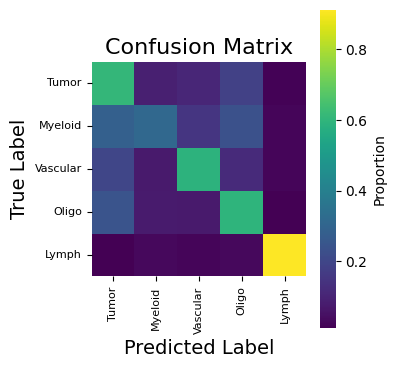


L12 sublineage
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/conf_matrix_level12.pdf


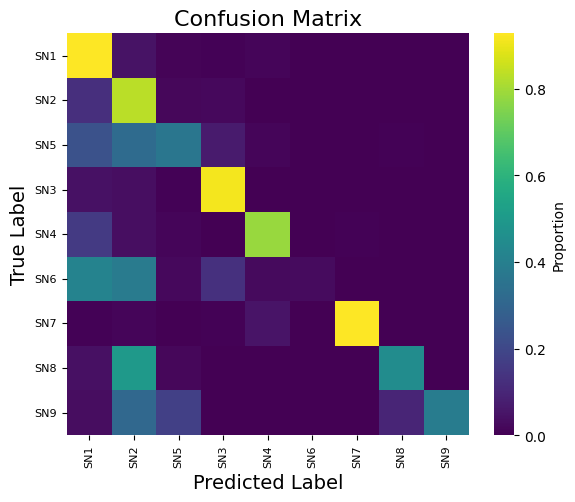

Skip L3 CNiche: no val_preds_level3 (re-run ablation cell after reload model/base)
Skip L4 TNiche: no val_preds_level4 (re-run ablation cell after reload model/base)
Saved: conf_matrix_level2 / level1 / level12 (+ L1head if available)


In [9]:
# L2 OOF needs group-CV LP. CLI-only load has no val_preds — skip OOF.
if pooled_ctx.g.get("val_preds") is not None:
    brca_cli.step_pooled_he_validate(pooled_ctx)
else:
    print("SKIP_POOLED_TRAIN: skip OOF HE validate (no LP). Using loaded checkpoint for in-sample plots.")

# Extra: L1 + L12 confusion from the loaded deployment model on all pooled cells
g = pooled_ctx.g
_nbr = g.get("spatial_neighbor_index")
ensure_lp_extra_insample_preds(
    g["model"],
    scaler,
    cv_data,
    device,
    predict_all_label_heads,
    g,
    neighbor_index=_nbr,
)

g["class_names"] = class_names
g["class_names_level1"] = class_names_level1
g["class_names_level12"] = class_names_level12

print("\n[Three-level internal] confusion matrices →", pooled_result_dir)
plot_he_confusion_matrices(plot_confusion_matrix, pooled_result_fig, cv_data, g)
print("Saved: conf_matrix_level2 / level1 / level12 (+ L1head if available)")


## 4. StarDist predict (each dataset) — three levels

For each sample with `{sample}_matched_features_stardist.h5ad`:

Outputs under `Results/{save_result}/stardist/{sample}/`:
- Spatial: `celltype_pred_stardist_level{2,1,12}.jpg`
- ROC: `roc_stardist_level{2,1,1_L1head,12}.pdf`
- Metrics (L2): `validation_external_stardist_matched_*.csv`


### Run StarDist one level at a time

`step_pooled_stardist(pooled_ctx)` without `levels=` runs **all three heads** (L2, L1, L12).

To run a single tier, pass e.g. `levels=["l2"]`. Valid keys: `l2`, `l1`, `l12`.

- **L2 only** writes `validation_external_stardist_matched_*.csv`.
- Other tiers write spatial / ROC / AUROC table for that head.
- Optional: `samples=POOLED_SAMPLES[:1]` to test on one region first.


In [10]:
import importlib
importlib.reload(brca_cli)

from uni_label_cv_helpers import make_pooled_stardist_result_fig

_TIER_CHECKS = {
    "l2": ("L2 celltype (final_CT)", "stardist_pred_level2", "roc_stardist_level2"),
    "l1": ("L1 lineage (final_lineage)", "stardist_pred_level1", "roc_stardist_level1"),
    "l12": ("L12 sublineage (final_sublineage)", "stardist_pred_level12", "roc_stardist_level12"),
}


def check_stardist_level(level, sample=None):
    # Print spatial/ROC file status for one tier on one sample.
    demo = sample or POOLED_SAMPLES[0]
    title, spatial_key, roc_key = _TIER_CHECKS[level.lower()]
    rf, _ = make_pooled_stardist_result_fig(DATA_ROOT, demo, save_result)
    sp, rc = rf(spatial_key), rf(roc_key)
    print(
        f"{title} ({demo}): "
        f"spatial={'OK' if Path(sp).is_file() else 'MISSING'} | "
        f"ROC={'OK' if Path(rc).is_file() else 'MISSING'}"
    )


def ensure_stardist_h5ads(samples=None, build=True):
    # Build missing {sample}_matched_features_stardist.h5ad via CLI helper.
    samples = list(samples) if samples is not None else list(POOLED_SAMPLES)
    n_missing = 0
    for s in samples:
        p = CASES_ROOT / s / f"{s}_matched_features_stardist.h5ad"
        if p.is_file():
            continue
        n_missing += 1
        if not build:
            print(f"  MISSING StarDist h5ad: {p}")
            continue
        print(f"Building StarDist h5ad for {s} ...", flush=True)
        ctx = brca_cli.RunContext(
            sample=s,
            cases_root=CASES_ROOT,
            python_root=Path(path),
            therapy_data=s,
            therapy_model=brca_cli.DEFAULT_THERAPY_MODEL,
            save_result="result",
            device=device,
            seed=SEED,
            match_tolerance=1.0,
            column_rename=dict(brca_cli.HCC_COLUMN_RENAME),
            force_rebuild_h5ad=False,
            input_dim=None,
            hidden_dims=POOLED_HIDDEN_DIMS,
            cv_k=5,
            stratify_target="level2",
            patience=10,
            max_epochs=50,
            train_batch_size=4096,
            resume_from_checkpoints=True,
            ablation_tag=POOLED_ABLATION_TAG,
            hce_w1=1.0, hce_w2=2.0, hce_w12=1.0, hce_w_l12head=1.0, hce_w_l3=1.0, hce_w_l4=1.0,
            build_stardist_h5ad=True,
            acq_id=_acq_map[s],
            stardist_root=brca_cli.DEFAULT_STARDIST_ROOT,
            use_spatial_context=POOLED_USE_SPATIAL,
            spatial_k=POOLED_SPATIAL_K,
            spatial_mode=POOLED_SPATIAL_MODE,
        )
        brca_cli._ensure_stardist_h5ad(ctx)
    print(f"StarDist h5ad: {len(samples) - n_missing} existing, built/attempted {n_missing}")


ensure_stardist_h5ads()


Loading dependencies...
StarDist h5ad: 2 existing, built/attempted 0


### L2 celltype / final_CT (StarDist)



[Pooled StarDist] levels=['l2'] | 2 datasets
Loading best model for StarDist prediction...
  Checkpoint file: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/cross_dataset_cv/D_emph_L2_spatial_bs4096/best_mlp_gpu.pt
  Using provided hidden_dims: [1024, 512, 256]
✓ StarDist model loaded
  Spatial inference: enabled (neighbor_index shape=(37369, 8))
  Loading data from matched_features_path...
  ✓ Loaded X from /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Cases/P174511_Initial/P174511_Initial_matched_features_stardist.h5ad: (37369, 1024)
  ✓ Loaded y from /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Cases/P174511_Initial/P174511_Initial_matched_features_stardist.h5ad: (37369,), dtype: object
  ⚠ prediction_only=True: Labels will be used for visualization only, not for evaluation.
  ✓ Keeping labels as strings for visualization (no encoding needed)
  ✓ Scaled X using provided scaler
  X_all_scaled shape: (37369, 1024)
  No labels available - pred

Predicting: 100%|██████████| 37/37 [00:02<00:00, 14.32it/s]



Prediction completed:
  Total predictions: 37369
  Predicted classes: [ 0  1  2  5  6  7  8  9 10 12 13 14 15]
  ✓ Using original labels for visualization: 37369 labels
  ✓ Computed metrics in prediction_only mode from aligned true labels: acc=0.3610, macro_f1=0.2744, weighted_f1=0.3378

Preparing spatial distribution plot...
  Matching predictions with coordinates...
  ✓ Loaded coordinates from /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Cases/P174511_Initial/P174511_Initial_matched_features_stardist.h5ad: (37369, 2)
  Coordinates shape: (37369, 2)
  Predictions shape: (37369,)
  ✓ Created prediction DataFrame with 37369 cells

Plotting spatial distribution of PREDICTED level2 cell types...
Number of valid data points: 37369
Number of cell types: 13


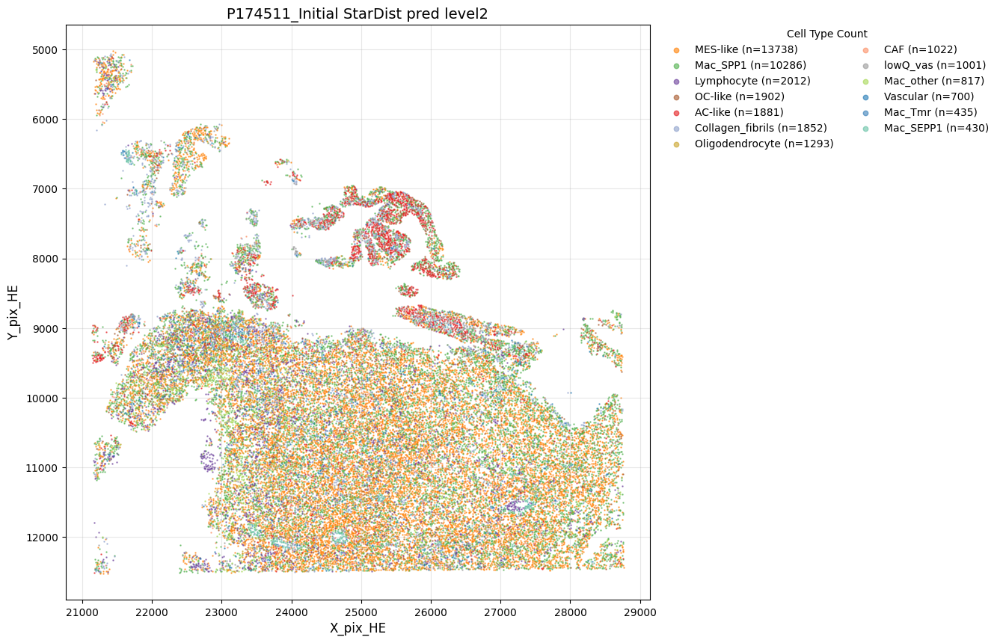


Plotting spatial distribution of TRUE level2 cell types...
Number of valid data points: 37369
Number of cell types: 13


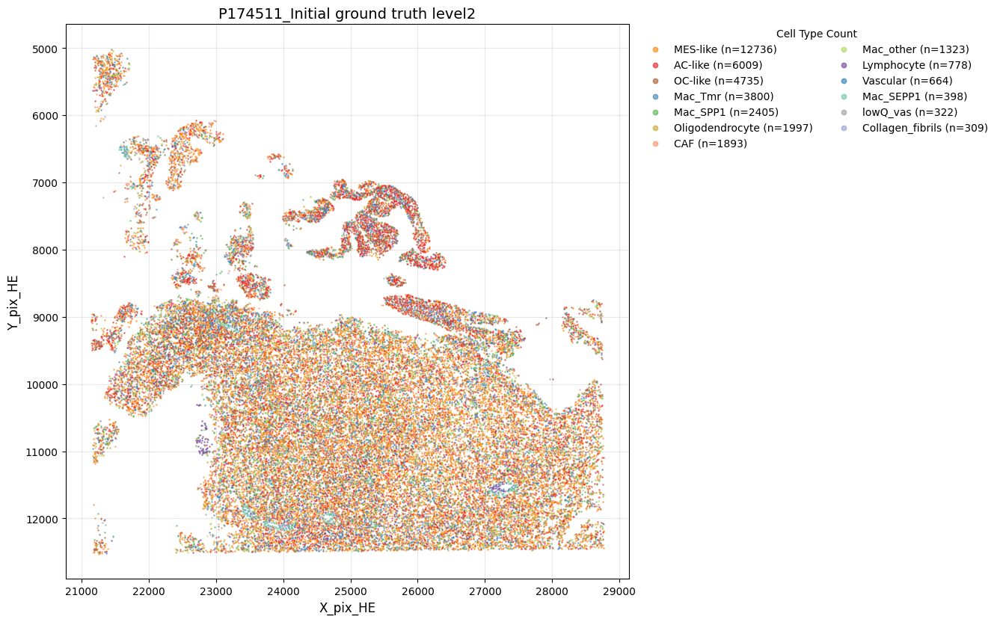

  ROC colors: codex_gbm_fine (aligned with dataset spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/roc_stardist_level2.pdf


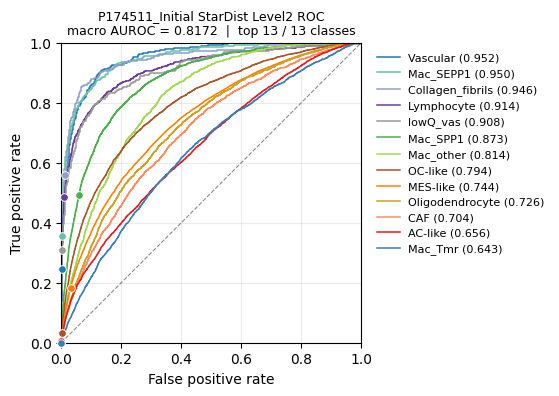

  P174511_Initial: StarDist L2 macro AUROC = 0.8172
Skip L3 CNiche: missing preds_l3
Skip L4 TNiche: missing preds_l4
Current run metrics:
             timestamp                      therapy_data best_epoch  \
0  2026-09-11 17:25:15  P174511_Initial_stardist_matched       None   

  hce_lambda  hce_w1  hce_w2  hce_w12  hce_w_l12head  hce_w_l3  hce_w_l4  ...  \
0       None     1.0     2.0      1.0            1.0       1.0       1.0  ...   

   insample_l12_macro_f1  insample_l12_weighted_f1  num_l1_head_classes  \
0               0.169915                  0.622798                    5   

   num_l12_classes  insample_l2_macro_auc  insample_l1_macro_auc  \
0                9               0.817151               0.786366   

   insample_l1_head_macro_auc  insample_l12_macro_auc  val_l2_macro_auc  \
0                    0.701451                0.720624          0.817151   

   val_l1_macro_auc  
0          0.786366  

[1 rows x 38 columns]

Saved comparison table to: /home/lingyu/ssd2/Pyt

Predicting: 100%|██████████| 131/131 [00:10<00:00, 13.05it/s]



Prediction completed:
  Total predictions: 133433
  Predicted classes: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]
  ✓ Using original labels for visualization: 133433 labels
  ✓ Computed metrics in prediction_only mode from aligned true labels: acc=0.2349, macro_f1=0.2647, weighted_f1=0.2201

Preparing spatial distribution plot...
  Matching predictions with coordinates...
  ✓ Loaded coordinates from /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Cases/P179161_Recurrent/P179161_Recurrent_matched_features_stardist.h5ad: (133433, 2)
  Coordinates shape: (133433, 2)
  Predictions shape: (133433,)
  ✓ Created prediction DataFrame with 133433 cells

Plotting spatial distribution of PREDICTED level2 cell types...
Number of valid data points: 133433
Number of cell types: 16


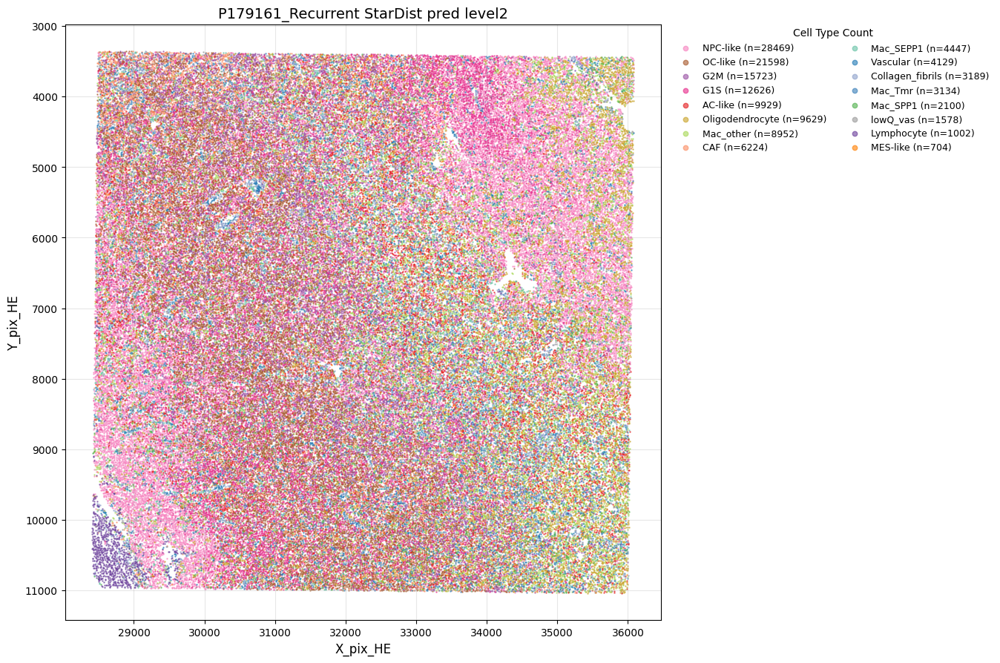


Plotting spatial distribution of TRUE level2 cell types...
Number of valid data points: 133433
Number of cell types: 16


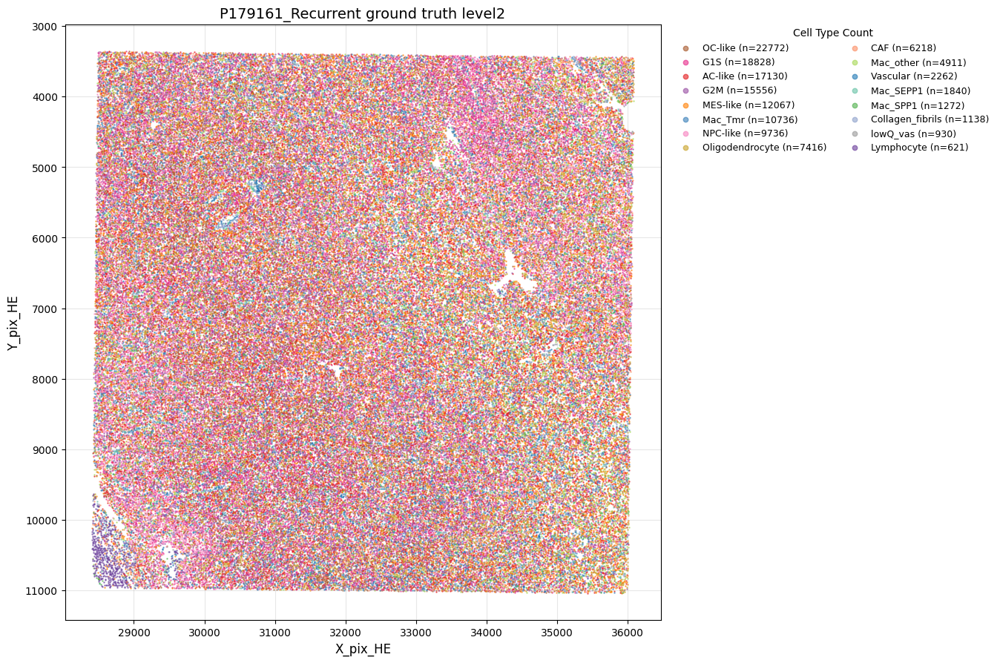

  ROC colors: codex_gbm_fine (aligned with dataset spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P179161_Recurrent/roc_stardist_level2.pdf


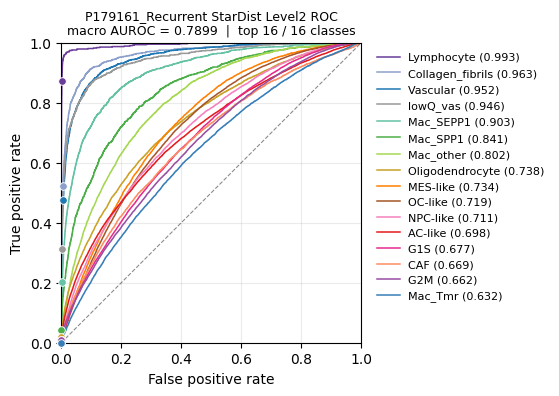

  P179161_Recurrent: StarDist L2 macro AUROC = 0.7899
Skip L3 CNiche: missing preds_l3
Skip L4 TNiche: missing preds_l4
Current run metrics:
             timestamp                        therapy_data best_epoch  \
0  2026-09-11 17:25:43  P179161_Recurrent_stardist_matched       None   

  hce_lambda  hce_w1  hce_w2  hce_w12  hce_w_l12head  hce_w_l3  hce_w_l4  ...  \
0       None     1.0     2.0      1.0            1.0       1.0       1.0  ...   

   insample_l12_macro_f1  insample_l12_weighted_f1  num_l1_head_classes  \
0               0.228419                  0.447236                    5   

   num_l12_classes  insample_l2_macro_auc  insample_l1_macro_auc  \
0                9               0.789934               0.789303   

   insample_l1_head_macro_auc  insample_l12_macro_auc  val_l2_macro_auc  \
0                    0.681914                0.745343          0.789934   

   val_l1_macro_auc  
0          0.789303  

[1 rows x 38 columns]

Saved comparison table to: /home/lingyu/ss

In [11]:
brca_cli.step_pooled_stardist(pooled_ctx, levels=["l2"])
check_stardist_level("l2")


### L1 lineage / final_lineage (StarDist)



[Pooled StarDist] levels=['l1'] | 2 datasets
Loading best model for StarDist prediction...
  Checkpoint file: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/cross_dataset_cv/D_emph_L2_spatial_bs4096/best_mlp_gpu.pt
  Using provided hidden_dims: [1024, 512, 256]
✓ StarDist model loaded
Number of valid data points: 37369
Number of cell types: 5


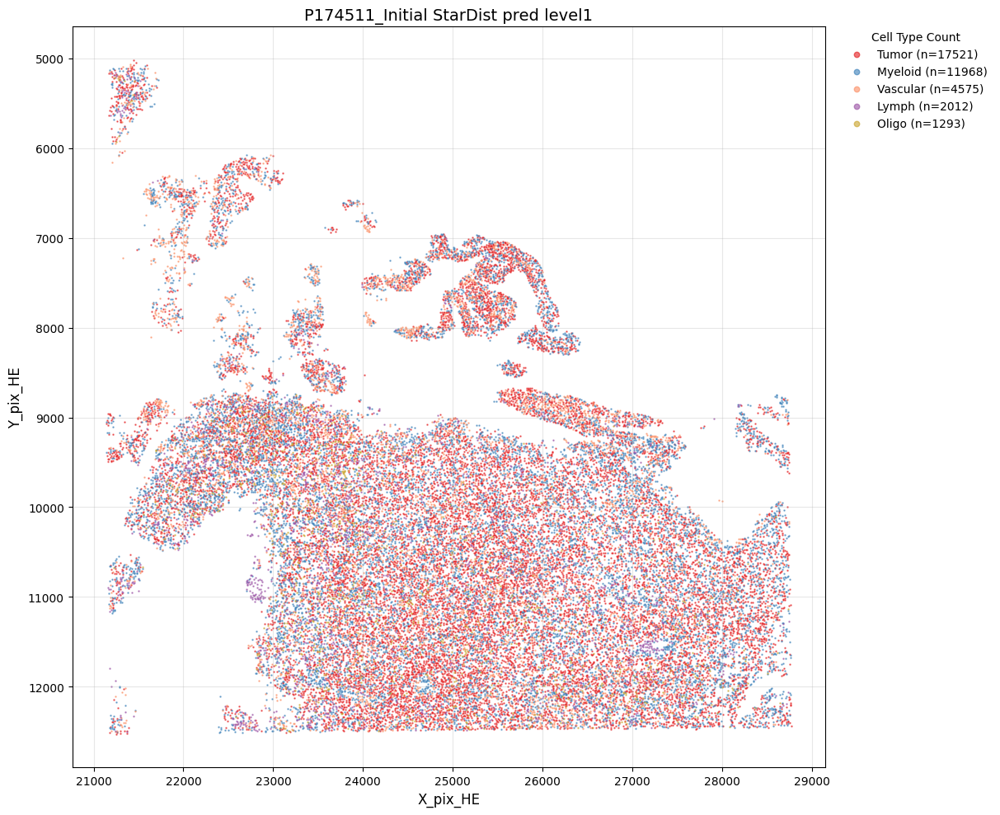

  Saved level1 predicted spatial plot: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/celltype_pred_stardist_level1.jpg
Number of valid data points: 37369
Number of cell types: 5


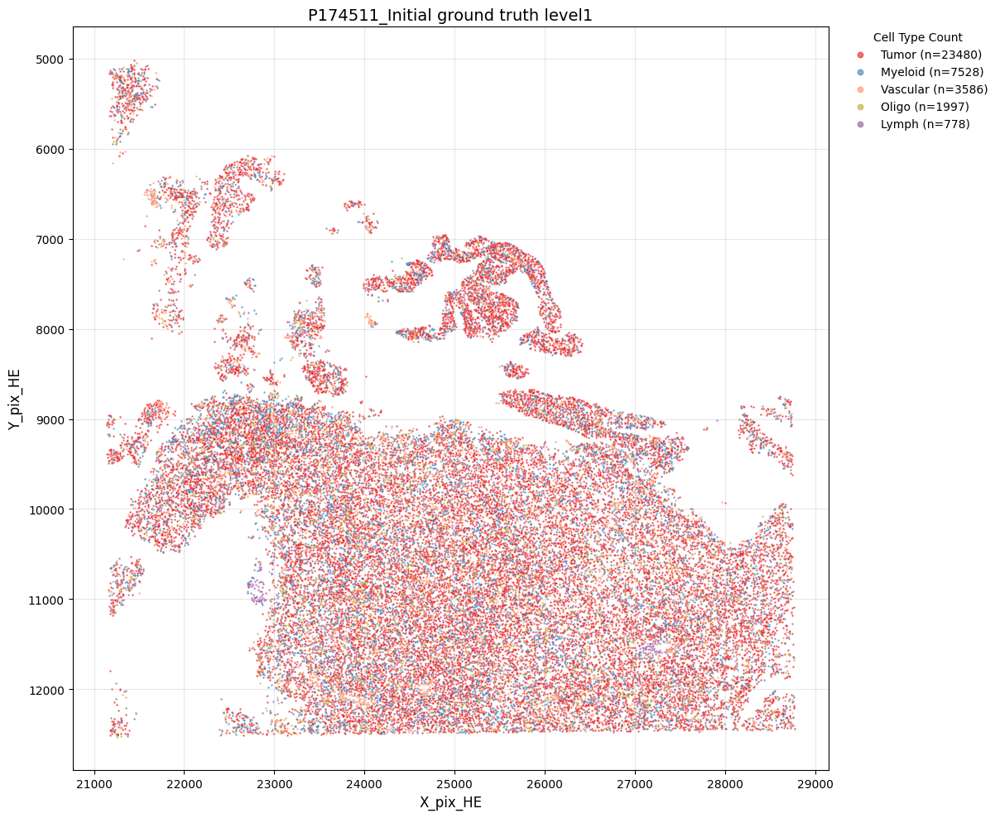

  ROC colors: codex_gbm_coarse (aligned with dataset spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/roc_stardist_level1.pdf


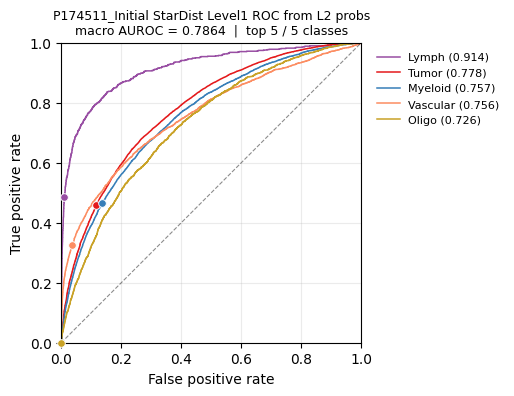

Saved StarDist L1 AUROC table: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/validation_external_stardist_matched_AUROC_level1.csv (37,369 cells; prob_0..prob_4 match class_names order)
  Class name order: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/validation_external_stardist_matched_AUROC_level1_class_names.csv
Loading best model for StarDist prediction...
  Checkpoint file: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/cross_dataset_cv/D_emph_L2_spatial_bs4096/best_mlp_gpu.pt
  Using provided hidden_dims: [1024, 512, 256]
✓ StarDist model loaded
Number of valid data points: 133433
Number of cell types: 5


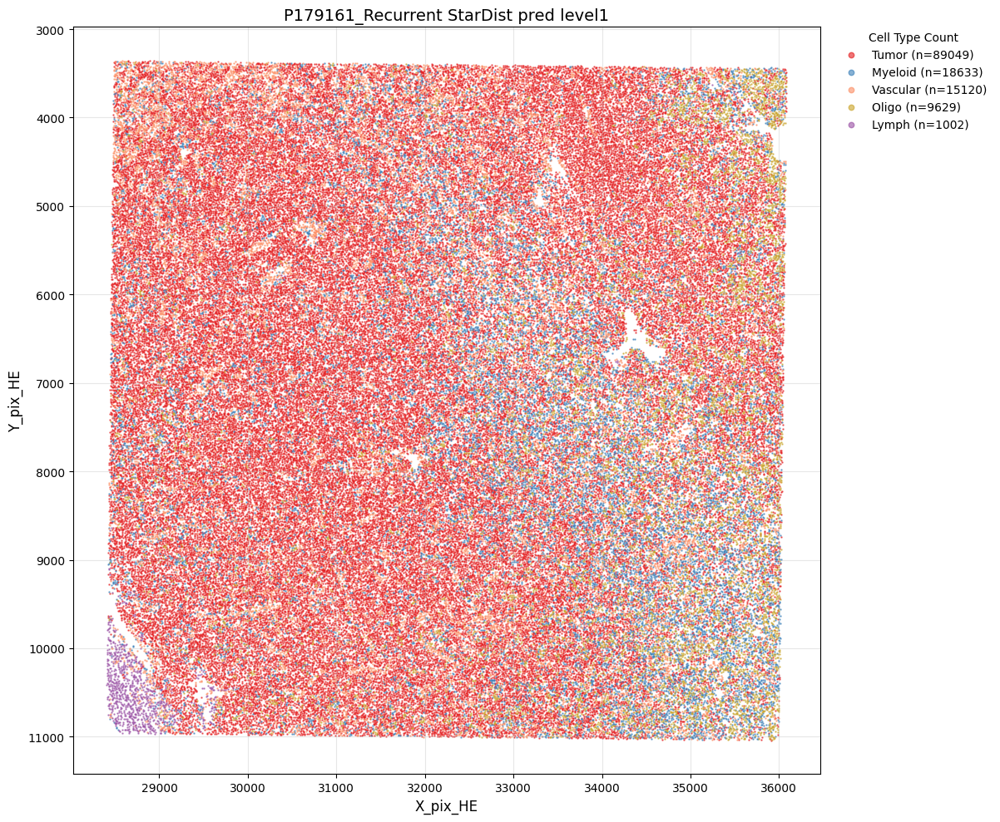

  Saved level1 predicted spatial plot: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P179161_Recurrent/celltype_pred_stardist_level1.jpg
Number of valid data points: 133433
Number of cell types: 5


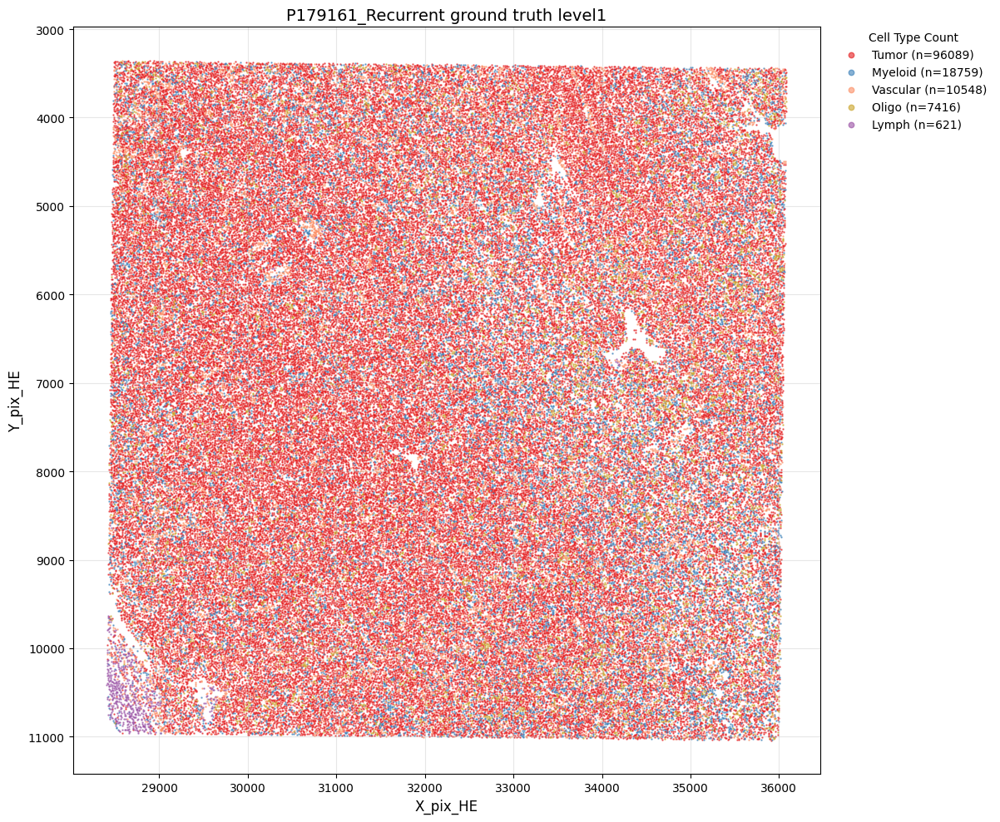

  ROC colors: codex_gbm_coarse (aligned with dataset spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P179161_Recurrent/roc_stardist_level1.pdf


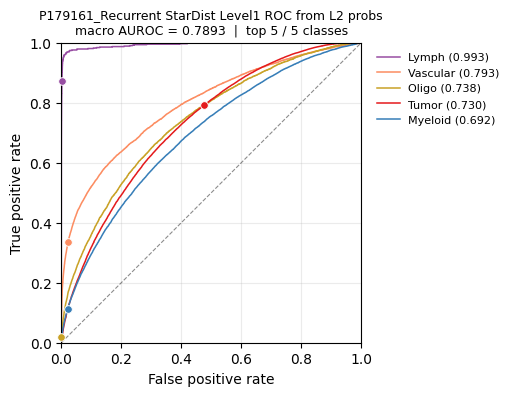

Saved StarDist L1 AUROC table: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P179161_Recurrent/validation_external_stardist_matched_AUROC_level1.csv (133,433 cells; prob_0..prob_4 match class_names order)
  Class name order: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P179161_Recurrent/validation_external_stardist_matched_AUROC_level1_class_names.csv
L1 lineage (final_lineage) (P174511_Initial): spatial=OK | ROC=OK


In [12]:
brca_cli.step_pooled_stardist(pooled_ctx, levels=["l1"])
check_stardist_level("l1")


### L12 sublineage / final_sublineage (StarDist)



[Pooled StarDist] levels=['l12'] | 2 datasets
Loading best model for StarDist prediction...
  Checkpoint file: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/cross_dataset_cv/D_emph_L2_spatial_bs4096/best_mlp_gpu.pt
  Using provided hidden_dims: [1024, 512, 256]
✓ StarDist model loaded

L12 sublineage (StarDist)
Number of valid data points: 37369
Number of cell types: 8


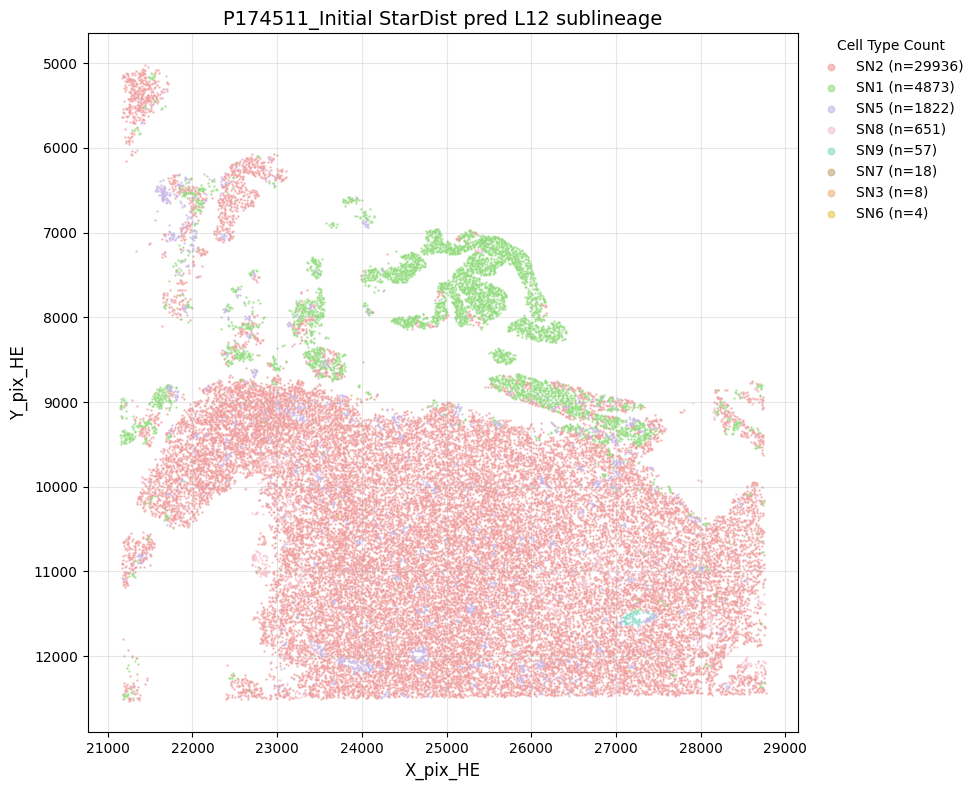

  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/celltype_pred_stardist_level12.jpg
Number of valid data points: 37369
Number of cell types: 6


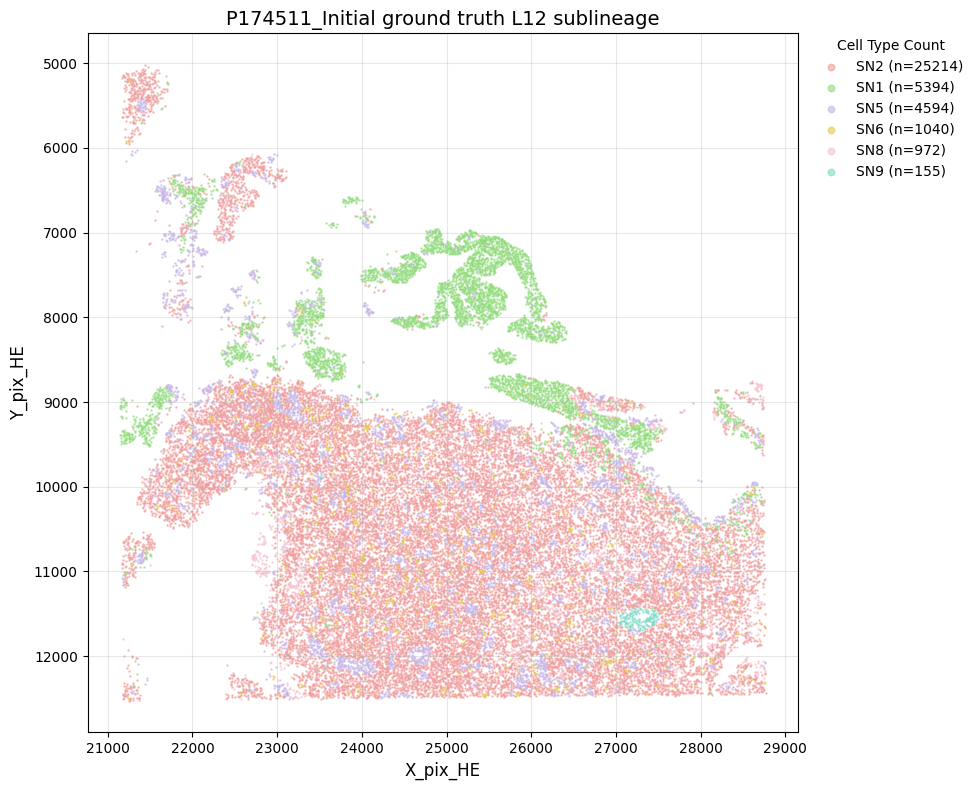

  Saved ground-truth spatial plot: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/celltype_true_stardist_level12.jpg
Saved: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/celltype_pred_stardist_level12.jpg

L12 sublineage (StarDist) ROC
  ROC colors: codex_gbm_intermediate (aligned with dataset spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/roc_stardist_level12.pdf


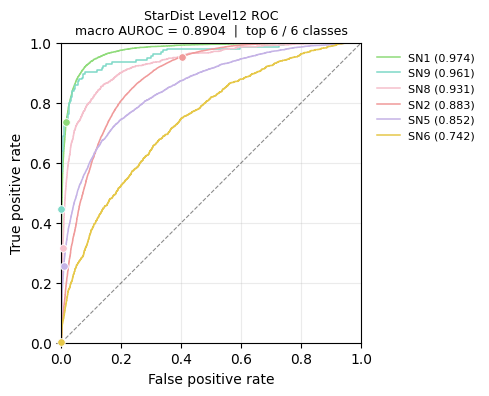

Saved: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/roc_stardist_level12.pdf
Saved StarDist L12 AUROC table: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/validation_external_stardist_matched_AUROC_level12.csv (37,369 cells; prob_0..prob_8 match class_names order)
  Class name order: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/validation_external_stardist_matched_AUROC_level12_class_names.csv
Loading best model for StarDist prediction...
  Checkpoint file: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/cross_dataset_cv/D_emph_L2_spatial_bs4096/best_mlp_gpu.pt
  Using provided hidden_dims: [1024, 512, 256]
✓ StarDist model loaded

L12 sublineage (StarDist)
Number of valid data points: 133433
Number of cell types: 7


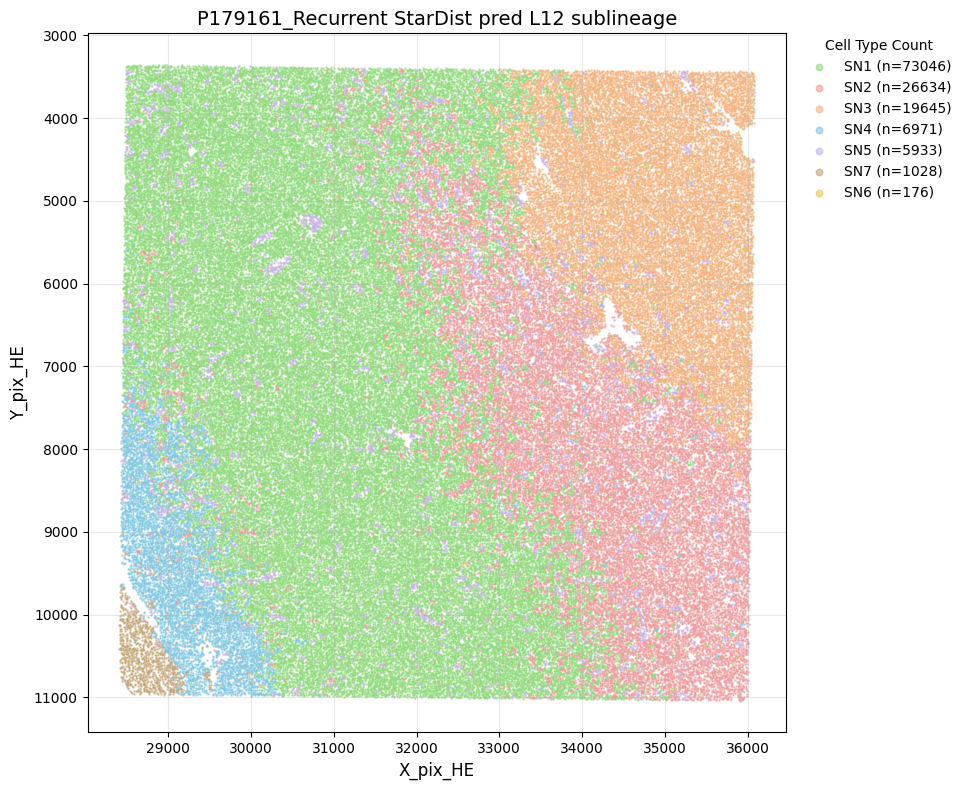

  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P179161_Recurrent/celltype_pred_stardist_level12.jpg
Number of valid data points: 133433
Number of cell types: 7


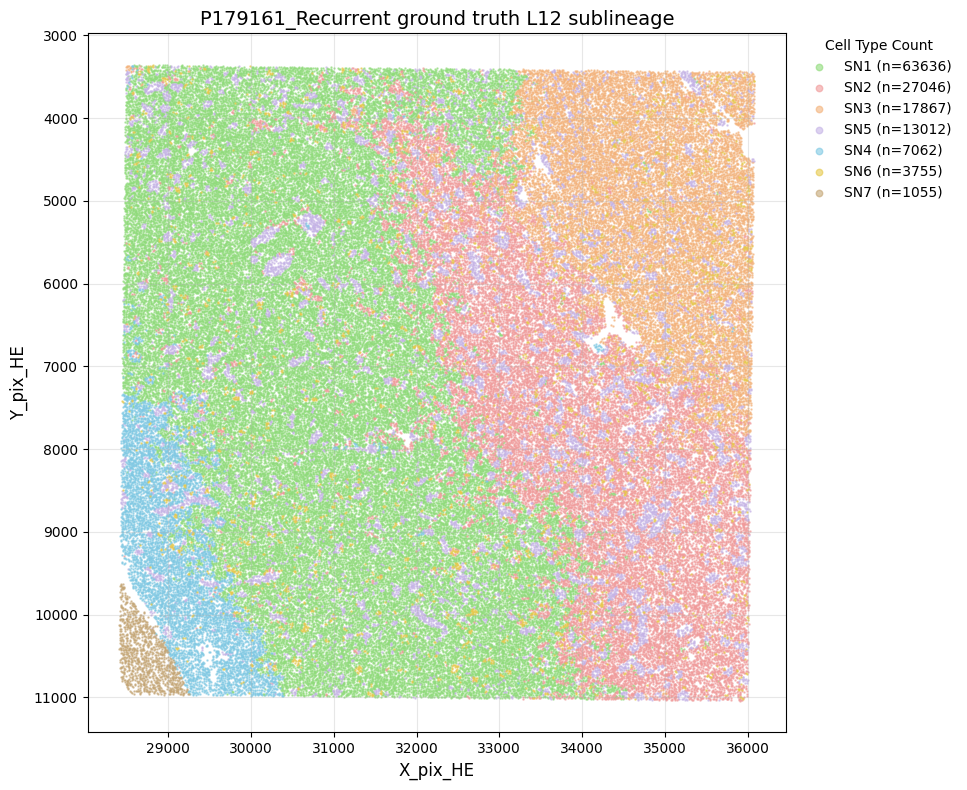

  Saved ground-truth spatial plot: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P179161_Recurrent/celltype_true_stardist_level12.jpg
Saved: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P179161_Recurrent/celltype_pred_stardist_level12.jpg

L12 sublineage (StarDist) ROC
  ROC colors: codex_gbm_intermediate (aligned with dataset spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P179161_Recurrent/roc_stardist_level12.pdf


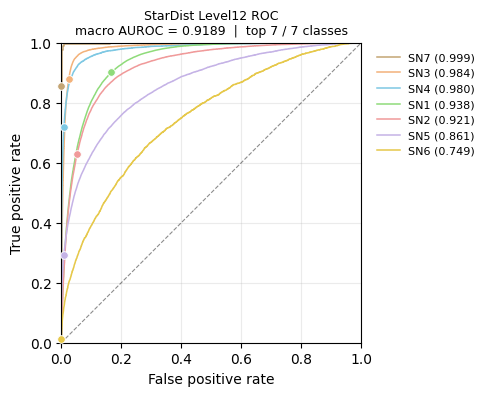

Saved: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P179161_Recurrent/roc_stardist_level12.pdf
Saved StarDist L12 AUROC table: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P179161_Recurrent/validation_external_stardist_matched_AUROC_level12.csv (133,433 cells; prob_0..prob_8 match class_names order)
  Class name order: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P179161_Recurrent/validation_external_stardist_matched_AUROC_level12_class_names.csv
L12 sublineage (final_sublineage) (P174511_Initial): spatial=OK | ROC=OK


In [13]:
brca_cli.step_pooled_stardist(pooled_ctx, levels=["l12"])
check_stardist_level("l12")


In [14]:
# Summary check for all three tiers on first sample
print(f"StarDist outputs: {pooled_result_dir / 'stardist'}")
for level in ("l2", "l1", "l12"):
    check_stardist_level(level)


StarDist outputs: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist
L2 celltype (final_CT) (P174511_Initial): spatial=OK | ROC=OK
L1 lineage (final_lineage) (P174511_Initial): spatial=OK | ROC=OK
L12 sublineage (final_sublineage) (P174511_Initial): spatial=OK | ROC=OK


In [15]:
# Optional: inspect L2 metrics / AUROC CSV for one sample
_demo = POOLED_SAMPLES[0]
_rf, _ = make_pooled_stardist_result_fig(DATA_ROOT, _demo, save_result)
_metrics = _rf("validation_external_stardist_matched_metrics")
_auroc = _auroc_csv_path_from_metrics(_metrics)
print(f"Demo: {_demo}")
print(" metrics:", _metrics)
print(" AUROC:", _auroc)
if Path(_metrics).is_file():
    display(pd.read_csv(_metrics).tail(1).T)


Demo: P174511_Initial
 metrics: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/validation_external_stardist_matched_metrics.csv
 AUROC: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/validation_external_stardist_matched_AUROC.csv


,6
timestamp,2026-09-11 17:25:15
therapy_data,P174511_Initial_stardist_matched
best_epoch,NaN
hce_lambda,NaN
hce_w1,1.0
hce_w2,2.0
hce_w12,1.0
hce_w_l12head,1.0
hce_w_l3,1.0
hce_w_l4,1.0


### L1 / L12 — detailed file list


In [16]:
# Inspect L1 + L12 outputs for one sample
_demo = POOLED_SAMPLES[0]
_rf, _ = make_pooled_stardist_result_fig(DATA_ROOT, _demo, save_result)
_tiers = {
    "L1": ("stardist_pred_level1", "roc_stardist_level1", "roc_stardist_level1_L1head"),
    "L12": ("stardist_pred_level12", "stardist_true_level12", "roc_stardist_level12"),
}
for tier, keys in _tiers.items():
    print(f"\n{tier}:")
    for key in keys:
        p = Path(_rf(key))
        print(f"  {'✓' if p.is_file() else '✗'} {p.name}")



L1:
  ✓ celltype_pred_stardist_level1.jpg
  ✓ roc_stardist_level1.pdf
  ✗ roc_stardist_level1_L1head.pdf

L12:
  ✓ celltype_pred_stardist_level12.jpg
  ✓ celltype_true_stardist_level12.jpg
  ✓ roc_stardist_level12.pdf


## 5. StarDist predict on all nuclei of Ini/Rec StarDist_Segment

Unlike **§4**, which evaluates matched GT-annotated nuclei with ground truth and AUROC, this section predicts **every StarDist nucleus on the microscope HE**.

Training labels exist only on the **Visium HD chip** (~37k Ini / ~138k Rec). StarDist on the full WSI is much larger (~178k Ini / ~1.16M Rec). UNI embeddings are already under:

`data/CODEX/GBM/Cases/{sample}/project_all_UNI/ImgEmbeddings_all_stardist/sc_pth_16_16`

The cell below builds `{sample}_all_features_stardist.h5ad` from those embeddings if missing, then predicts with `best_mlp_gpu.pt`. Rec is RAM/time-heavy; drop it from `FULL_HE_SAMPLES` in the config cell to skip.

**Output:** `data/CODEX/GBM/Results/{save_result}/stardist/{sample}/{sample}_all_features_stardist_label.h5ad`

Three heads: `l2` / `l12` / `l1`. No GT AUROC (most nuclei are outside the chip). Spatial kNN is per-slide on StarDist centroids. Run **§2** first.


```python
conda run --no-capture-output -n SeededNTM python -u \
code/CODEX_gbm/transer_embedding_label_h5ad.py \
--steps stardist_all_h5ad
```


In [17]:
import importlib
importlib.reload(brca_cli)  # pick up ensure_stardist_all_h5ad without kernel restart
# Full-HE StarDist-all: chip GT ⊂ microscope WSI. Uses pooled_ctx.g from §2.
from uni_label_cv_helpers import stardist_all_label_h5ad_path

if "BEST_MLP_CHECKPOINT" not in pooled_ctx.g:
    raise RuntimeError("Run §2 (step_pooled_train or SKIP_POOLED_TRAIN load) first.")

_full_he = list(globals().get("FULL_HE_SAMPLES", POOLED_SAMPLES))
print(f"Full-HE samples: {_full_he}")
for sample in _full_he:
    h5ad = brca_cli.ensure_stardist_all_h5ad(sample, cases_root=CASES_ROOT)
    print(f"  input h5ad: {h5ad}")
    out = stardist_all_label_h5ad_path(DATA_ROOT, sample, save_result)
    if out.is_file():
        print(f"  skip predict (exists): {out.name}")
        continue
    brca_cli.step_pooled_stardist_all_one_sample(pooled_ctx, sample)

print(f"StarDist-all label h5ads → {pooled_result_dir / 'stardist'}")
for sample in _full_he:
    out = stardist_all_label_h5ad_path(DATA_ROOT, sample, save_result)
    print(f"  {sample}: {out.name if out.is_file() else 'MISSING'}")


Loading dependencies...
Full-HE samples: ['P174511_Initial', 'P179161_Recurrent']

[StarDist all h5ad] P174511_Initial  embeddings=/home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Cases/P174511_Initial/project_all_UNI/ImgEmbeddings_all_stardist/sc_pth_16_16
  [StarDist all h5ad] P174511_Initial_all_features_stardist.h5ad
Loading HIPT embeddings (full scan: 178,303 .pth files, cap=400,000; skipping selective path probe).
  Loading embeddings...


Loading .pth files (workers=16): 100%|██████████| 178303/178303 [02:50<00:00, 1047.93it/s]


  Successfully loaded 178303 embeddings
  Embedding dimension: (1024,)

  Using specified coordinates: centroid_x, centroid_y
  Building KDTree for embeddings: 178,303 points
  KDTree matched 178,303 / 178,303 cells (100.00%).
  -> 178,303/178,303 rows matched (100.00%), 1024 features
  input h5ad: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Cases/P174511_Initial/P174511_Initial_all_features_stardist.h5ad
Loading best model for StarDist prediction...
  Checkpoint file: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/cross_dataset_cv/D_emph_L2_spatial_bs4096/best_mlp_gpu.pt
  Using provided hidden_dims: [1024, 512, 256]
✓ StarDist model loaded
  P174511_Initial: saved P174511_Initial_all_features_stardist_label.h5ad (178,303 cells; 30 prob columns; heads=['l1', 'l12', 'l2'])

[StarDist all h5ad] P179161_Recurrent  embeddings=/home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Cases/P179161_Recurrent/project_all_UNI/ImgEmbeddings_all_stardist/sc_pth_16

Resolve .pth paths: 100%|██████████| 1164175/1164175 [01:18<00:00, 14870.43it/s]


  Existing .pth paths matched: 1,164,174


Loading .pth (workers=16): 100%|██████████| 1164174/1164174 [17:20<00:00, 1118.91it/s]


  Unique .pth files read: 1,164,174
  Embedding coordinate keys: 1,164,174
  Successfully loaded 1164174 embeddings
  Embedding dimension: (1024,)

  Using specified coordinates: centroid_x, centroid_y
  Building KDTree for embeddings: 1,164,174 points
  KDTree matched 1,164,174 / 1,164,175 cells (100.00%).
  -> 1,164,174/1,164,175 rows matched (100.00%), 1024 features
  input h5ad: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Cases/P179161_Recurrent/P179161_Recurrent_all_features_stardist.h5ad
Loading best model for StarDist prediction...
  Checkpoint file: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/cross_dataset_cv/D_emph_L2_spatial_bs4096/best_mlp_gpu.pt
  Using provided hidden_dims: [1024, 512, 256]
✓ StarDist model loaded
  P179161_Recurrent: saved P179161_Recurrent_all_features_stardist_label.h5ad (1,164,174 cells; 30 prob columns; heads=['l1', 'l12', 'l2'])
StarDist-all label h5ads → /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Resu

In [18]:
import anndata as ad

# Inspect the first pooled GBM sample without loading the full matrix into memory.
_demo = POOLED_SAMPLES[0]
_demo_h5ad = stardist_all_label_h5ad_path(DATA_ROOT, _demo, save_result)
print(f"Demo: {_demo}\n  {_demo_h5ad}")
if _demo_h5ad.is_file():
    _a = ad.read_h5ad(_demo_h5ad, backed="r")
    try:
        prob_cols = [c for c in _a.obs.columns if "_prob_" in c]
        print(f"  n_obs={_a.n_obs:,}  prob columns={len(prob_cols)}")
        print(f"  heads in uns: {list(_a.uns.get('pred_prob_class_names', {}).keys())}")
        print(f"  sample obs cols: {list(_a.obs.columns[:8])} ...")
    finally:
        # Close the backed AnnData file handle after inspection.
        _a.file.close()
else:
    print("  (file not found — run the cell above first)")


Demo: P174511_Initial
  /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/P174511_Initial_all_features_stardist_label.h5ad
  n_obs=178,303  prob columns=30
  heads in uns: ['l1', 'l12', 'l2']
  sample obs cols: ['cell_id', 'centroid_x', 'centroid_y', 'probability', 'l2_prob_0', 'l2_prob_1', 'l2_prob_2', 'l2_prob_3'] ...


In [19]:
# Uncomment to run all three heads for every pooled sample in one pass:
# brca_cli.step_pooled_stardist(pooled_ctx, levels=["l2", "l1", "l12"])
# for level in ("l2", "l1", "l12"):
#     check_stardist_level(level)
print("Skip by default — use per-level cells in §4, or uncomment above.")


Skip by default — use per-level cells in §4, or uncomment above.


## 6. Full microscope HE (same two slides, beyond the Visium HD chip)

There is **no** HCC-style rest / Incomplete_Cases set. The two training slides are still only partially labeled: Visium HD covers a chip-sized window on the microscope HE (left panel in the preview), while StarDist + UNI already exist for the **entire** WSI (right panel, e.g. Ini `38976×16128`).

| sample | GT / train nuclei (chip) | StarDist UNI on full HE |
|---|---:|---:|
| `P174511_Initial` | ~37k | ~178k |
| `P179161_Recurrent` | ~138k | ~1.16M |

Use the pooled checkpoint from **§2** to label every StarDist nucleus. Embeddings:

`Cases/{sample}/project_all_UNI/ImgEmbeddings_all_stardist/sc_pth_16_16`

If **§5** already wrote `*_all_features_stardist_label.h5ad`, this section only inspects and plots. Rec is RAM/time-heavy; drop it from `FULL_HE_SAMPLES` to skip.


In [20]:
import importlib
importlib.reload(brca_cli)  # pick up ensure_stardist_all_h5ad without kernel restart
# No extra HCC-style rest slides. Full-HE of the same two WSIs (chip ⊂ microscope HE).
from uni_label_cv_helpers import stardist_all_label_h5ad_path

REST_SAMPLES_ALL = brca_cli.discover_brca_rest_samples(
    CASES_ROOT, brca_cli.DEFAULT_STARDIST_ROOT, require_h5ad=False,
)
print(f"GBM rest (unannotated extra slides): {len(REST_SAMPLES_ALL)} (expected 0)")

_full_he = list(globals().get("FULL_HE_SAMPLES", POOLED_SAMPLES))
if "BEST_MLP_CHECKPOINT" not in pooled_ctx.g:
    raise RuntimeError("Run §2 (step_pooled_train or SKIP_POOLED_TRAIN load) first.")

print(f"Full-HE samples: {_full_he}")
for sample in _full_he:
    emb = CASES_ROOT / sample / brca_cli.DEFAULT_THERAPY_MODEL / "ImgEmbeddings_all_stardist" / "sc_pth_16_16"
    has_emb = emb.is_dir() and next(emb.glob("*.pth"), None) is not None
    print(f"  {sample}: StarDist UNI dir={'OK' if has_emb else 'MISSING'}  {emb}")
    h5ad = brca_cli.ensure_stardist_all_h5ad(sample, cases_root=CASES_ROOT)
    out = stardist_all_label_h5ad_path(DATA_ROOT, sample, save_result)
    if out.is_file():
        print(f"  skip predict (exists): {out}")
        continue
    brca_cli.step_pooled_stardist_all_one_sample(pooled_ctx, sample)

print(f"Full-HE label h5ads → {pooled_result_dir / 'stardist'}")
for sample in _full_he:
    out = stardist_all_label_h5ad_path(DATA_ROOT, sample, save_result)
    print(f"  {sample}: {out.name if out.is_file() else 'MISSING'}")


Loading dependencies...
GBM rest (unannotated extra slides): 0 (expected 0)
Full-HE samples: ['P174511_Initial', 'P179161_Recurrent']
  P174511_Initial: StarDist UNI dir=OK  /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Cases/P174511_Initial/project_all_UNI/ImgEmbeddings_all_stardist/sc_pth_16_16

[StarDist all h5ad] P174511_Initial  embeddings=/home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Cases/P174511_Initial/project_all_UNI/ImgEmbeddings_all_stardist/sc_pth_16_16
  [StarDist all h5ad] cache valid, skip: P174511_Initial_all_features_stardist.h5ad
  skip predict (exists): /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/P174511_Initial_all_features_stardist_label.h5ad
  P179161_Recurrent: StarDist UNI dir=OK  /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Cases/P179161_Recurrent/project_all_UNI/ImgEmbeddings_all_stardist/sc_pth_16_16

[StarDist all h5ad] P179161_Recurrent  embeddings=/home/lingyu/ssd2/Python/Hist2Phen

In [21]:
import anndata as ad
from uni_label_cv_helpers import stardist_all_label_h5ad_path

_full_he = list(globals().get("FULL_HE_SAMPLES", POOLED_SAMPLES))
_demo = next(
    (s for s in _full_he if stardist_all_label_h5ad_path(DATA_ROOT, s, save_result).is_file()),
    None,
)
if _demo is None:
    print("No full-HE label h5ad yet — run the cell above (or §5).")
else:
    _demo_h5ad = stardist_all_label_h5ad_path(DATA_ROOT, _demo, save_result)
    print(f"Demo full HE: {_demo}\n  {_demo_h5ad}")
    _a = ad.read_h5ad(_demo_h5ad, backed="r")
    try:
        prob_cols = [c for c in _a.obs.columns if "_prob_" in c]
        print(f"  n_obs={_a.n_obs:,}  prob columns={len(prob_cols)}")
        print(f"  heads in uns: {list(_a.uns.get('pred_prob_class_names', {}).keys())}")
        print(f"  sample obs cols: {list(_a.obs.columns[:8])} ...")
    finally:
        _a.file.close()


Demo full HE: P174511_Initial
  /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/P174511_Initial_all_features_stardist_label.h5ad
  n_obs=178,303  prob columns=30
  heads in uns: ['l1', 'l12', 'l2']
  sample obs cols: ['cell_id', 'centroid_x', 'centroid_y', 'probability', 'l2_prob_0', 'l2_prob_1', 'l2_prob_2', 'l2_prob_3'] ...


### Plot cell type (full microscope HE)


In [22]:
from uni_label_cv_helpers import stardist_all_label_h5ad_path

_full_he = [
    s for s in globals().get("FULL_HE_SAMPLES", POOLED_SAMPLES)
    if stardist_all_label_h5ad_path(DATA_ROOT, s, save_result).is_file()
]
print(f"Plotting full-HE samples × {brca_cli.GBM_STARDIST_HEADS}: {_full_he}")
full_he_spatial = brca_cli.plot_gbm_full_he_stardist_spatial_maps(
    DATA_ROOT, _full_he, save_result, pan_organ=brca_cli.PAN_ORGAN,
)


Plotting full-HE samples × ('l2', 'l12', 'l1'): ['P174511_Initial', 'P179161_Recurrent']
  P174511_Initial: n=178,303
Number of valid data points: 178303
Number of cell types: 15
  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/P174511_Initial_stardist_pred_l2.jpg
  saved P174511_Initial_stardist_pred_l2.jpg
Number of valid data points: 178303
Number of cell types: 9
  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/P174511_Initial_stardist_pred_l12.jpg
  saved P174511_Initial_stardist_pred_l12.jpg
Number of valid data points: 178303
Number of cell types: 5
  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/P174511_Initial/P174511_Initial_stardist_pred_l1.jpg
  saved P174511_Initial_stardist_pred_l1.jpg
  P179161_Recurrent: n=1,164,174
Number of valid

Overview datasets (n=2):
  1. P174511_Initial  n=178,303
  2. P179161_Recurrent  n=1,164,174
  figsize=12.0 × 9.1 in  dpi=200
Overview → /home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/GBM/Results/result_all_spatial/stardist/full_he_spatial_pred_overview_l2_l12_l1.jpg


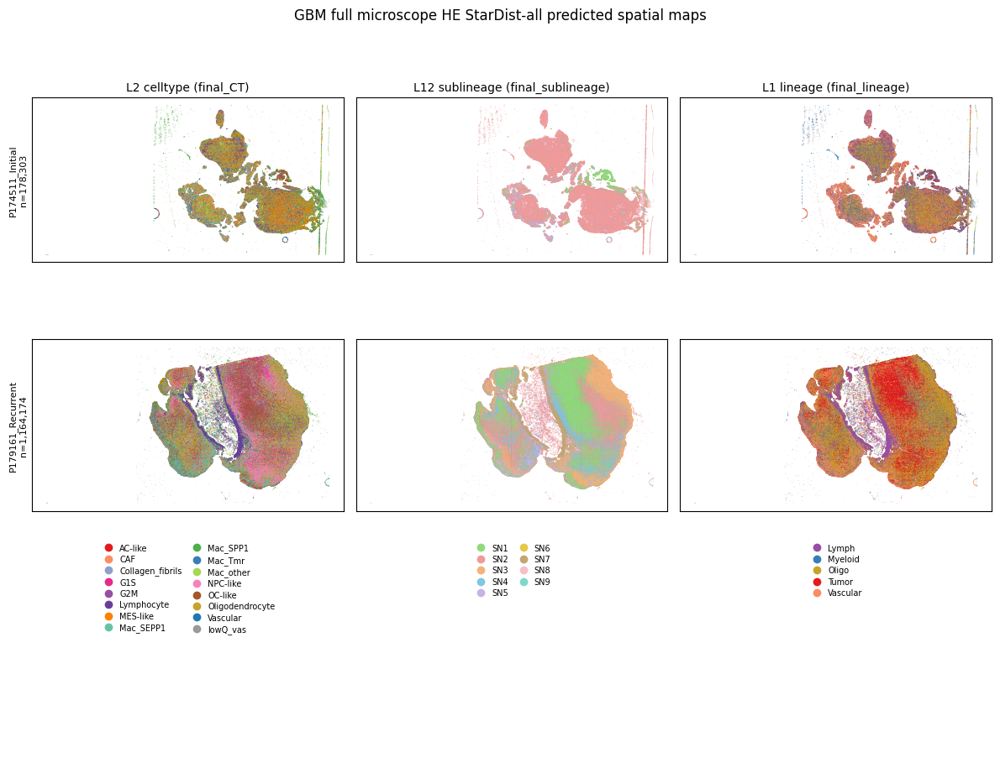

In [23]:
brca_cli.plot_gbm_full_he_stardist_spatial_overview(
    full_he_spatial, DATA_ROOT, save_result,
    pan_organ=brca_cli.PAN_ORGAN, point_size=0.2,
)


## Notes

- GBM uses **three heads** (L2 / L12 / L1), like HCC, not lung's five-head CNiche/TNiche.
- Training GT is only the **Visium HD chip**; §5/§6 predict the rest of the same two microscope HEs. There are no extra rest slides.
- Per-sample notebook: `GBM_train_validate_cv_UNIlabel_single.ipynb`
- Batch CLI: `GBM_train_validate_cv_UNIlabel.py --mode cross-dataset`
- Rec full-HE is ~1.16M nuclei; drop it from `FULL_HE_SAMPLES` if RAM is tight.
